## Tomato Pollination Example

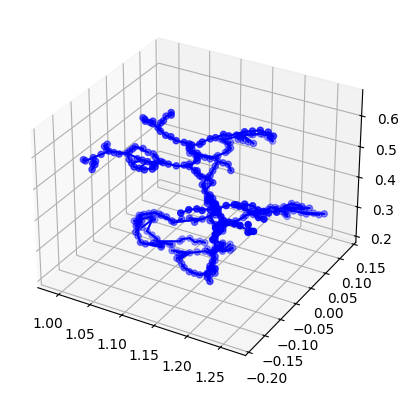

In [1]:
import numpy as np
import time
import dismech

geom = dismech.GeomParams(
    rod_r0=2e-2,
    shell_h=0.0,
)

material = dismech.Material(density=2000,
                            youngs_rod=1e8,
                            youngs_shell=0,
                            poisson_rod=0.5,
                            poisson_shell=0)

dyn_sim = dismech.SimParams(static_sim=False,
                                  two_d_sim=True,   # no twisting
                                  use_mid_edge=False,
                                  use_line_search=False,
                                  show_floor=False,
                                  log_data=True,
                                  log_step=1,
                                  dt=1e-2,
                                  max_iter=50,
                                  total_time=1,
                                  plot_step=1,
                                  tol=1e-4,
                                  ftol=1e-4,
                                  dtol=1e-2
                                  )

env = dismech.Environment()
env.add_force('gravity', g=np.array([0.0, 0.0, -1]))
# env.add_force('viscous', eta=5e-2)

geo = dismech.Geometry.from_txt(
    '../tests/resources/tomato_pollination/input.txt')

robot = dismech.SoftRobot(geom, material, geo, dyn_sim, env)

In [2]:
print(robot.q0[robot.map_node_to_dof(5)])

[ 1.162693 -0.074231  0.219337]


### Time Stepping

Move the stem: Moving BC

In [3]:
grasping_point =  np.array([
      1.1546931266784668,
      -0.04223068803548813,
      0.40333718061447144
    ])
grip_node = np.where(np.linalg.norm(robot.state.q[robot.node_dof_indices].reshape(-1, 3) - grasping_point, axis=1) < 1e-2)[0]
# grip_node = 147
lowest_z = np.min(robot.state.q[robot.node_dof_indices].reshape(-1, 3)[:, 2])

root_nodes_to_fix = np.where(abs(robot.state.q[robot.node_dof_indices].reshape(-1, 3)[:, 2] - lowest_z) < 1e-2)[0]

robot = robot.fix_nodes(np.union1d(grip_node, root_nodes_to_fix))

def shake(robot: dismech.SoftRobot, t: float):
    """ Simple example of a moving boundary condition """
    amplitude = 0.0002
    frequency = 5 # Hz
    displacement = amplitude * np.sin(2 * np.pi * frequency * t)
    robot = robot.move_nodes(grip_node, [displacement, 0, 0])
    return robot


stepper = dismech.ImplicitEulerTimeStepper(robot)
stepper.before_step = shake

In [4]:
print("grasping point:", grasping_point)
print("grasping point node:", grip_node)
print("fixed root nodes:", root_nodes_to_fix)

grasping point: [ 1.15469313 -0.04223069  0.40333718]
grasping point node: [147]
fixed root nodes: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21]


In [5]:
# fixed_points = np.array([21, 22, 24, 27, 28, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40])

# robot = robot.fix_nodes(fixed_points)

start = time.time()
robots = stepper.simulate()
end = time.time()

qs = np.stack([robot.state.q for robot in robots])

iter: 1, error: 526672.505
current_time:  0.01
iter: 1, error: 971158.587
iter: 2, error: 50163.661
iter: 3, error: 1919.650
current_time:  0.02
iter: 1, error: 1332292.794
iter: 2, error: 107709.150
iter: 3, error: 1929.746
current_time:  0.03
iter: 1, error: 1552985.439
iter: 2, error: 156290.008
iter: 3, error: 801.204
current_time:  0.04
iter: 1, error: 1632641.521
iter: 2, error: 177304.307
iter: 3, error: 4643.612
iter: 4, error: 13821.685
current_time:  0.05
iter: 1, error: 1558996.167
iter: 2, error: 156878.273
iter: 3, error: 763.340
iter: 4, error: 7621.218
current_time:  0.06
iter: 1, error: 1342854.785
iter: 2, error: 108527.872
iter: 3, error: 2012.119
iter: 4, error: 3416.807
current_time:  0.07
iter: 1, error: 993217.435
iter: 2, error: 53830.606
current_time:  0.08
iter: 1, error: 531657.863
iter: 2, error: 13985.563
current_time:  0.09
iter: 1, error: 3375.533
iter: 2, error: 1455.695
current_time:  0.1
iter: 1, error: 559043.218
iter: 2, error: 11394.382
current_time:

In [6]:
t = np.arange(robot.sim_params.total_time, step=robot.sim_params.dt)
options = dismech.AnimationOptions(title='Tomato plant')

fig = dismech.get_interactive_animation_plotly(robot, t, qs , options)
fig.show()

100


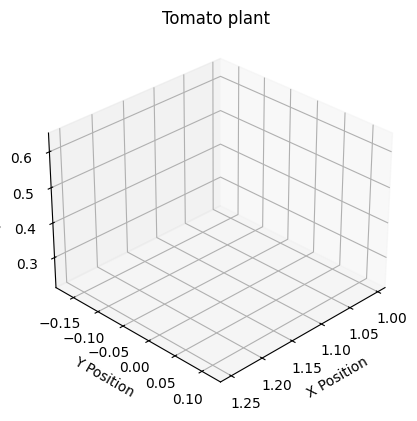

In [7]:
ani = dismech.get_animation(robot, t, qs, options)
ani.save('tomato.gif')